In [1]:
#!conda install -n base -c conda-forge jupyterlab_widgets -y

In [2]:
# conda install -c conda-forge ipywidgets

In [3]:
import random

import matplotlib
import matplotlib.pyplot as plt

import os

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Subset

import torchvision
from torchvision import datasets, models, transforms

from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

import pandas as pd
import numpy as np
import time
from tqdm import tqdm

from PIL import Image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device 객체

# Set random seed
SEED = 2021
random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)  # type: ignore
torch.backends.cudnn.deterministic = True  # type: ignore
torch.backends.cudnn.benchmark = True  # type: ignore

In [4]:
device

device(type='cuda', index=0)

In [5]:
# 데이터셋을 불러올 때 사용할 변형(transformation) 객체 정의
transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # 정규화(normalization)
])

In [6]:
from torch.utils.data import Dataset, DataLoader

class TestDataset(Dataset):
    def __init__(self, img_paths, transform):
        self.img_paths = img_paths
        self.transform = transform

    def __getitem__(self, index):
        image = Image.open(self.img_paths[index])

        if self.transform:
            image = self.transform(image)
        return image

    def __len__(self):
        return len(self.img_paths)

In [7]:
test_dir = '/opt/ml/input/cropped_v2.1/eval'
submission = pd.read_csv(os.path.join(test_dir, 'info.csv'))

In [8]:
def model_run(target, sub_df, test_dir, learning_rate = 0.001):
    train_data_dir = f'/opt/ml/input/cropped_v2.1/train/train_{target}/'
    valid_data_dir = f'/opt/ml/input/cropped_v2.1/train/valid_{target}/'
    
    train_dataset = datasets.ImageFolder(os.path.join(train_data_dir), transforms)
    valid_dataset = datasets.ImageFolder(os.path.join(valid_data_dir), transforms)
    
    print(f'*****{target}*****')
    print(train_dataset)
    print()
    
    class_names = train_dataset.classes
    print(class_names)
    print()
    
    dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=8)
    valid_dataloader = torch.utils.data.DataLoader(valid_dataset, batch_size=128, shuffle=False, num_workers=8)
    
    model = models.resnet34(pretrained=True)

    num_features = model.fc.in_features
    # 전이 학습(transfer learning): 모델의 출력 뉴런 수를 18개로 교체하여 마지막 레이어 다시 학습
    model.fc = nn.Linear(num_features, len(class_names)) 
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    
    num_epochs = 10
    model.train()
    start_time = time.time()

    # 전체 반복(epoch) 수 만큼 반복하며
    print('****start epoch****')
    for epoch in range(num_epochs):
        running_loss = 0.
        running_corrects = 0
        
        all_labels = []
        all_preds = []
        
        # 배치 단위로 학습 데이터 불러오기
        for inputs, labels in tqdm(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # 모델에 입력(forward)하고 결과 계산
            optimizer.zero_grad() # 전체 grad 값을 초기화.
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            
            all_preds.extend(preds.cpu().numpy())
            
            # 역전파를 통해 기울기(gradient) 계산 및 학습 진행
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            
            all_labels.extend(labels.data.cpu().numpy())
            
        epoch_loss = running_loss / len(train_dataset)
        epoch_acc = running_corrects / len(train_dataset) * 100.
        F1_score_train = f1_score(all_labels, all_preds, average='macro')
        
        # validation
        model.eval()
        
        all_labels = []
        all_preds = []
        all_inputs = []
        
        with torch.no_grad():
            running_loss = 0.
            running_corrects = 0
            
            for inputs, labels in valid_dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
        
                all_preds.extend(preds.cpu().numpy())
        
                loss = criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
        
                all_labels.extend(labels.data.cpu().numpy())
                all_inputs.extend(inputs.cpu().numpy())
        
            valid_epoch_loss = running_loss / len(valid_dataset)
            valid_epoch_acc = running_corrects / len(valid_dataset) * 100.
            F1_score = f1_score(all_labels, all_preds, average='macro')
        
        # 학습 과정 중에 결과 출력
        print('#{} Loss: {:.4f} Acc: {:.4f} F1 Score: {:.4f} % Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc, F1_score_train, time.time() - start_time))
        print(f'Valid Loss: {valid_epoch_loss:.4f} Valid Acc: {valid_epoch_acc:.4f} F1 Score: {F1_score:.4f}')
   
    valid_preds = all_preds
    valid_labels = all_labels
    valid_inputs = all_inputs    
            
    image_dir = os.path.join(test_dir, 'images')
    
    image_paths = [os.path.join(image_dir, img_id) for img_id in sub_df.ImageID]
    
    test_set = TestDataset(image_paths, transforms)
    
    test_dataloader = torch.utils.data.DataLoader(test_set, batch_size=128, shuffle=False, num_workers=8)
    
    all_predictions = []

    with torch.no_grad():
        for inputs in tqdm(test_dataloader):
            inputs = inputs.to(device)
        
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
        
            all_predictions.extend(preds.cpu().numpy())
    
    all_predictions2 = []

    for p in all_predictions:
        all_predictions2.append(class_names[p])
        
    sub_df[target] = all_predictions2
    
    return (sub_df, valid_preds, valid_labels, valid_inputs, valid_dataset.classes)

In [9]:
submission, v_p_m, v_l_m, v_i_m, m_c = model_run('mask', submission.copy(), test_dir)

*****mask*****
Dataset ImageFolder
    Number of datapoints: 15120
    Root location: /opt/ml/input/cropped_v2.1/train/train_mask/
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=PIL.Image.BILINEAR)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

['0', '12', '6']



  0%|          | 0/119 [00:00<?, ?it/s]

****start epoch****


  0%|          | 0/119 [00:00<?, ?it/s]

#0 Loss: 0.1933 Acc: 93.6376 F1 Score: 0.9034 % Time: 34.2436s
Valid Loss: 0.0429 Valid Acc: 98.7037 F1 Score: 0.9785


  0%|          | 0/119 [00:00<?, ?it/s]

#1 Loss: 0.0133 Acc: 99.6164 F1 Score: 0.9944 % Time: 66.8625s
Valid Loss: 0.0253 Valid Acc: 99.1005 F1 Score: 0.9855


  0%|          | 0/119 [00:00<?, ?it/s]

#2 Loss: 0.0048 Acc: 99.8743 F1 Score: 0.9982 % Time: 99.5773s
Valid Loss: 0.0164 Valid Acc: 99.4444 F1 Score: 0.9911


  0%|          | 0/119 [00:00<?, ?it/s]

#3 Loss: 0.0026 Acc: 99.9140 F1 Score: 0.9988 % Time: 132.3255s
Valid Loss: 0.0180 Valid Acc: 99.4709 F1 Score: 0.9913


  0%|          | 0/119 [00:00<?, ?it/s]

#4 Loss: 0.0008 Acc: 99.9934 F1 Score: 0.9999 % Time: 165.2256s
Valid Loss: 0.0147 Valid Acc: 99.5238 F1 Score: 0.9921


  0%|          | 0/119 [00:00<?, ?it/s]

#5 Loss: 0.0003 Acc: 100.0000 F1 Score: 1.0000 % Time: 197.9307s
Valid Loss: 0.0143 Valid Acc: 99.5503 F1 Score: 0.9924


  0%|          | 0/119 [00:00<?, ?it/s]

#6 Loss: 0.0002 Acc: 100.0000 F1 Score: 1.0000 % Time: 230.7464s
Valid Loss: 0.0147 Valid Acc: 99.5767 F1 Score: 0.9928


  0%|          | 0/119 [00:00<?, ?it/s]

#7 Loss: 0.0001 Acc: 100.0000 F1 Score: 1.0000 % Time: 263.5563s
Valid Loss: 0.0147 Valid Acc: 99.5767 F1 Score: 0.9928


  0%|          | 0/119 [00:00<?, ?it/s]

#8 Loss: 0.0001 Acc: 100.0000 F1 Score: 1.0000 % Time: 296.2454s
Valid Loss: 0.0145 Valid Acc: 99.5767 F1 Score: 0.9928


  0%|          | 0/99 [00:00<?, ?it/s]

#9 Loss: 0.0001 Acc: 100.0000 F1 Score: 1.0000 % Time: 329.1395s
Valid Loss: 0.0139 Valid Acc: 99.5503 F1 Score: 0.9924


100%|██████████| 99/99 [00:09<00:00, 10.58it/s]


pred: 6 label: 0


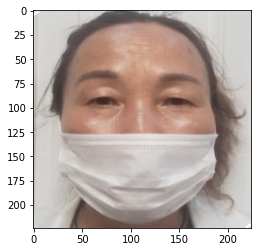

pred: 6 label: 0


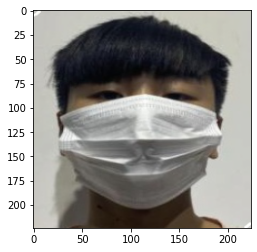

pred: 6 label: 0


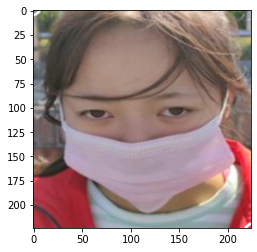

pred: 0 label: 6


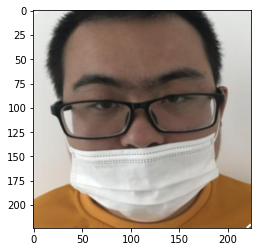

pred: 12 label: 6


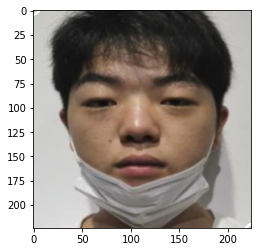

pred: 0 label: 6


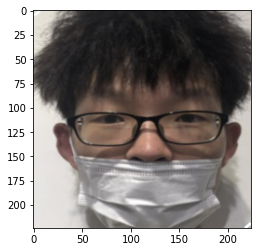

pred: 0 label: 6


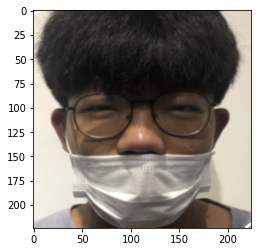

pred: 12 label: 6


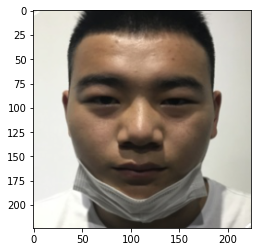

pred: 0 label: 6


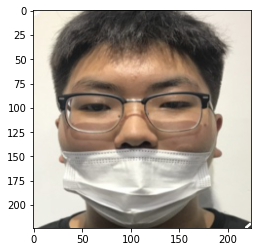

pred: 0 label: 6


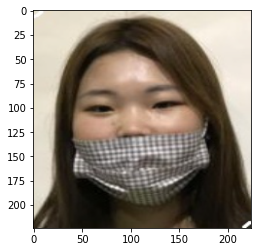

pred: 12 label: 6


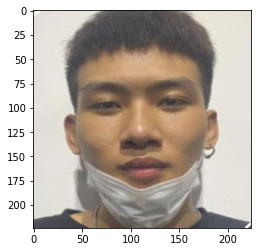

pred: 12 label: 6


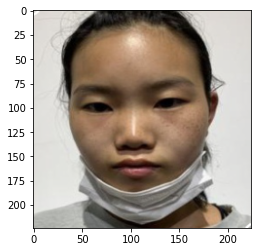

pred: 12 label: 6


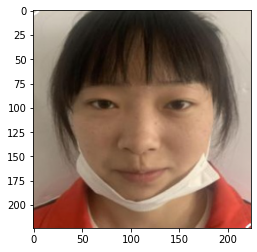

pred: 0 label: 6


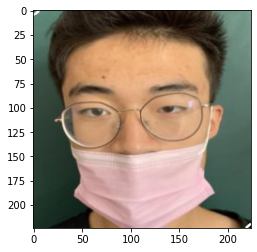

pred: 0 label: 6


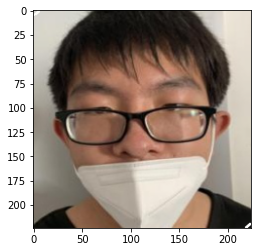

pred: 0 label: 6


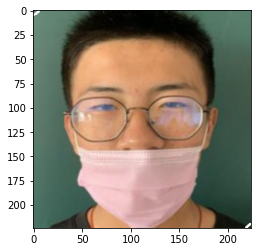

pred: 0 label: 6


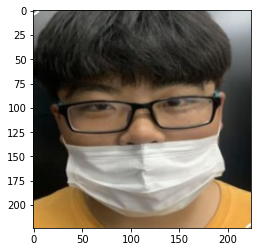

In [18]:
for p, l, im in zip(v_p_m, v_l_m, v_i_m):
    if p != l:
        pred = m_c[p]
        label = m_c[l]
        
        im = im.transpose((1, 2, 0))
        
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        im = std * im + mean
        im = np.clip(im, 0, 1)
        
        print(f'pred: {pred} label: {label}')
        plt.imshow(im)
        plt.show()

In [11]:
submission, v_p_g, v_l_g, v_i_g, g_c = model_run('gender', submission.copy(), test_dir)

*****gender*****
Dataset ImageFolder
    Number of datapoints: 15119
    Root location: /opt/ml/input/cropped_v2.1/train/train_gender/
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=PIL.Image.BILINEAR)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

['0', '3']



  0%|          | 0/119 [00:00<?, ?it/s]

****start epoch****


  0%|          | 0/119 [00:00<?, ?it/s]

#0 Loss: 0.2110 Acc: 90.8923 F1 Score: 0.9032 % Time: 33.4273s
Valid Loss: 0.0928 Valid Acc: 96.9849 F1 Score: 0.9680


  0%|          | 0/119 [00:00<?, ?it/s]

#1 Loss: 0.0554 Acc: 98.0157 F1 Score: 0.9791 % Time: 66.4191s
Valid Loss: 0.0623 Valid Acc: 98.0957 F1 Score: 0.9800


  0%|          | 0/119 [00:00<?, ?it/s]

#2 Loss: 0.0189 Acc: 99.3452 F1 Score: 0.9931 % Time: 99.1664s
Valid Loss: 0.0988 Valid Acc: 96.5882 F1 Score: 0.9638


  0%|          | 0/119 [00:00<?, ?it/s]

#3 Loss: 0.0090 Acc: 99.7090 F1 Score: 0.9969 % Time: 131.9432s
Valid Loss: 0.0909 Valid Acc: 96.9585 F1 Score: 0.9682


  0%|          | 0/119 [00:00<?, ?it/s]

#4 Loss: 0.0025 Acc: 99.9405 F1 Score: 0.9994 % Time: 164.7328s
Valid Loss: 0.0767 Valid Acc: 97.7784 F1 Score: 0.9766


  0%|          | 0/119 [00:00<?, ?it/s]

#5 Loss: 0.0004 Acc: 100.0000 F1 Score: 1.0000 % Time: 197.5543s
Valid Loss: 0.0974 Valid Acc: 97.5403 F1 Score: 0.9739


  0%|          | 0/119 [00:00<?, ?it/s]

#6 Loss: 0.0002 Acc: 100.0000 F1 Score: 1.0000 % Time: 230.3981s
Valid Loss: 0.0909 Valid Acc: 97.6726 F1 Score: 0.9754


  0%|          | 0/119 [00:00<?, ?it/s]

#7 Loss: 0.0001 Acc: 100.0000 F1 Score: 1.0000 % Time: 263.1613s
Valid Loss: 0.0907 Valid Acc: 97.8048 F1 Score: 0.9768


  0%|          | 0/119 [00:00<?, ?it/s]

#8 Loss: 0.0001 Acc: 100.0000 F1 Score: 1.0000 % Time: 295.9758s
Valid Loss: 0.0933 Valid Acc: 97.6990 F1 Score: 0.9757


  0%|          | 0/99 [00:00<?, ?it/s]

#9 Loss: 0.0001 Acc: 100.0000 F1 Score: 1.0000 % Time: 328.8451s
Valid Loss: 0.0957 Valid Acc: 97.6461 F1 Score: 0.9751


100%|██████████| 99/99 [00:09<00:00, 10.40it/s]


pred: 3 label: 0


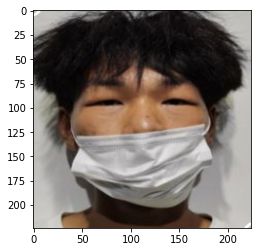

pred: 3 label: 0


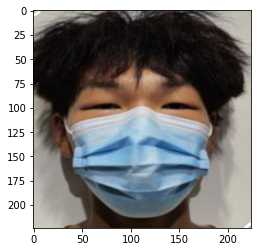

pred: 3 label: 0


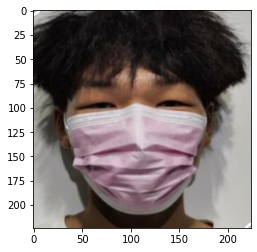

pred: 3 label: 0


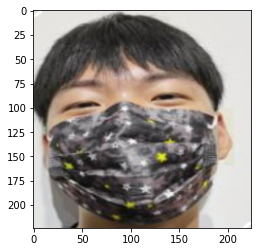

pred: 3 label: 0


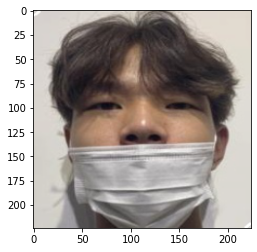

pred: 3 label: 0


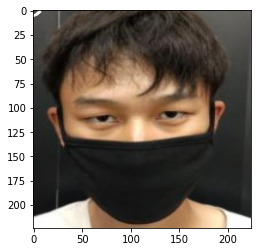

pred: 3 label: 0


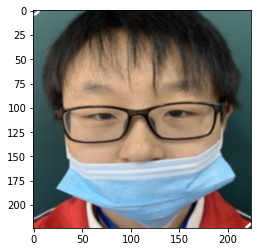

pred: 3 label: 0


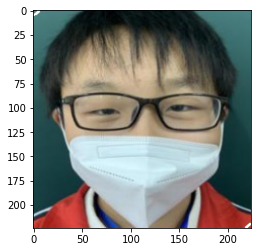

pred: 3 label: 0


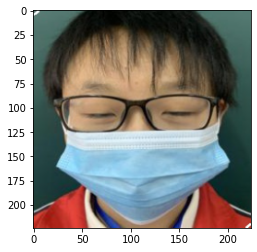

pred: 3 label: 0


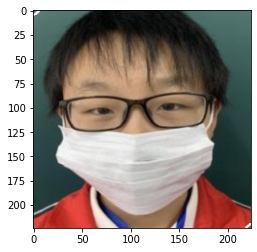

pred: 3 label: 0


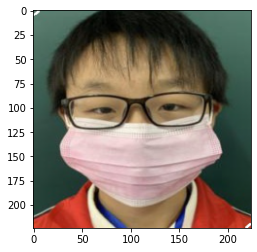

pred: 3 label: 0


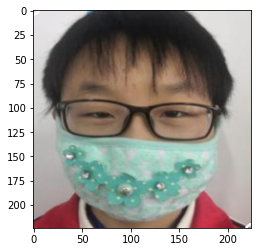

pred: 3 label: 0


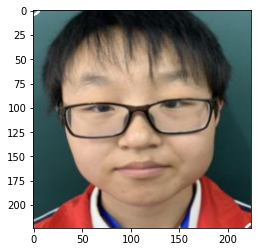

pred: 3 label: 0


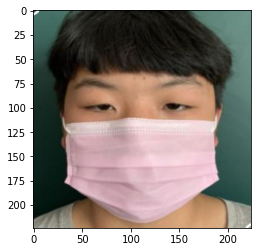

pred: 3 label: 0


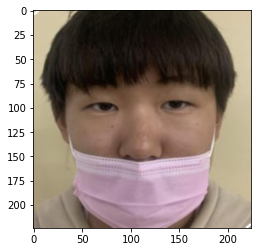

pred: 3 label: 0


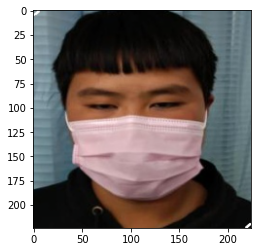

pred: 3 label: 0


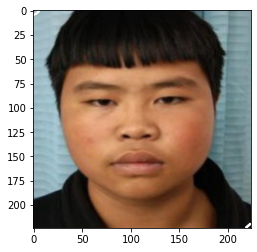

pred: 3 label: 0


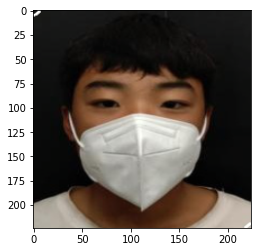

pred: 3 label: 0


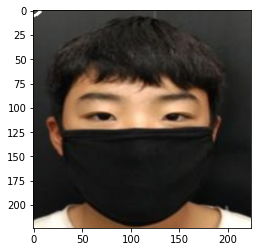

pred: 3 label: 0


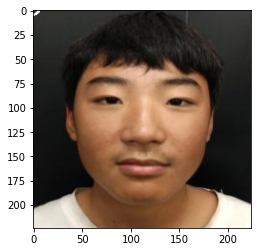

pred: 3 label: 0


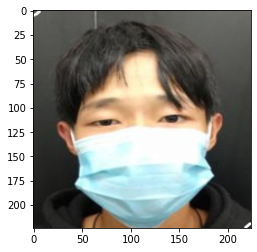

pred: 3 label: 0


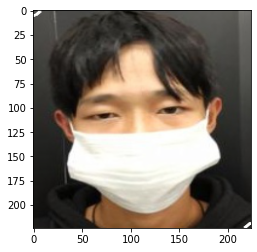

pred: 3 label: 0


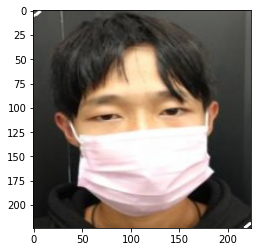

pred: 3 label: 0


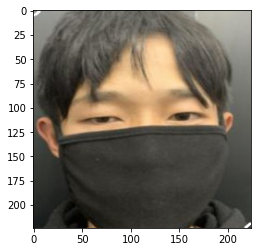

pred: 3 label: 0


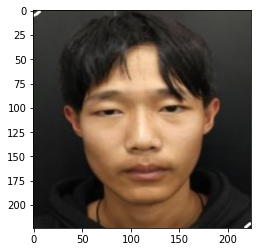

pred: 3 label: 0


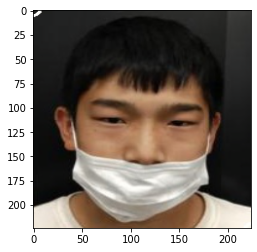

pred: 3 label: 0


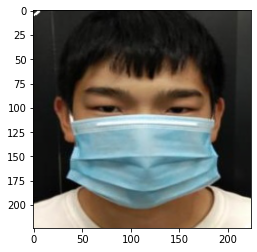

pred: 3 label: 0


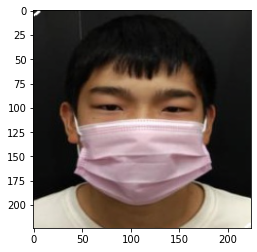

pred: 3 label: 0


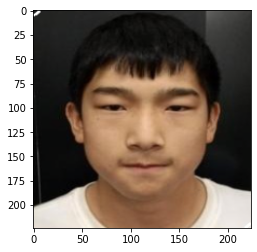

pred: 3 label: 0


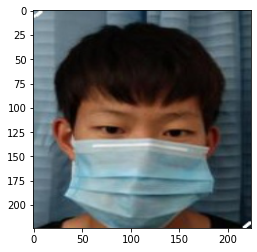

pred: 3 label: 0


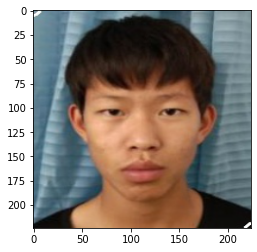

pred: 3 label: 0


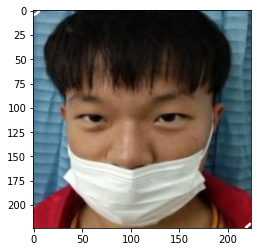

pred: 3 label: 0


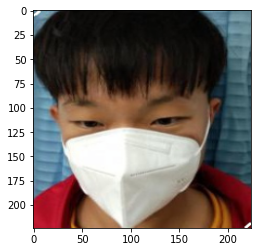

pred: 3 label: 0


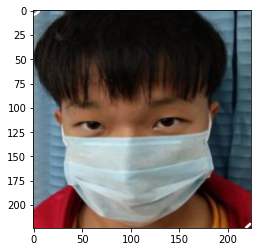

pred: 3 label: 0


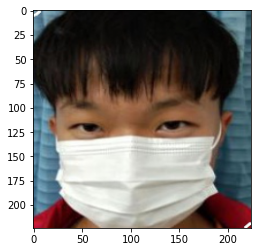

pred: 3 label: 0


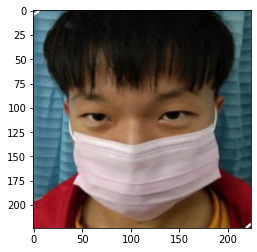

pred: 3 label: 0


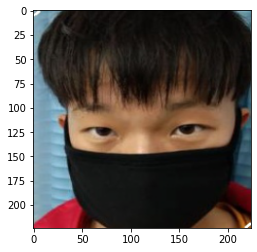

pred: 3 label: 0


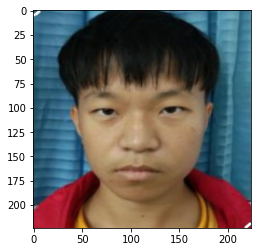

pred: 3 label: 0


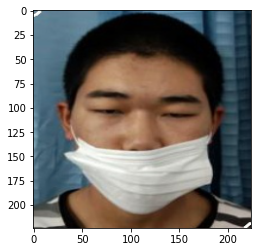

pred: 3 label: 0


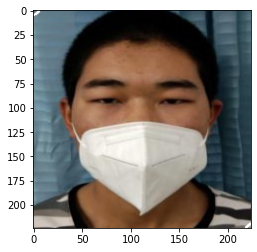

pred: 3 label: 0


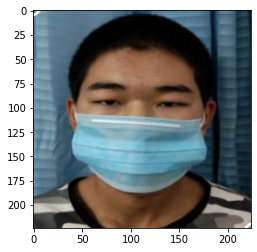

pred: 3 label: 0


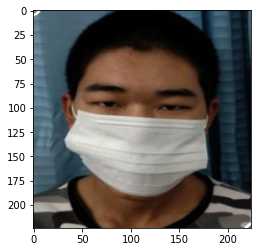

pred: 3 label: 0


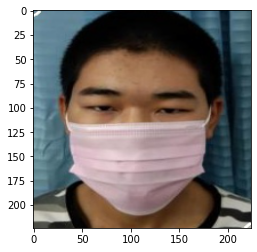

pred: 3 label: 0


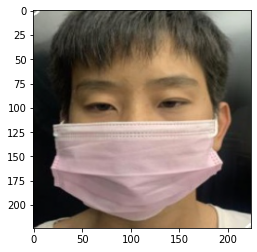

pred: 3 label: 0


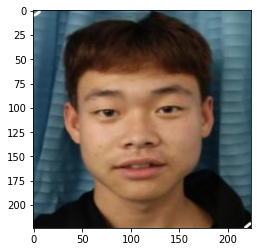

pred: 3 label: 0


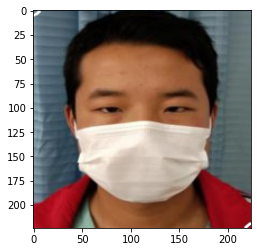

pred: 3 label: 0


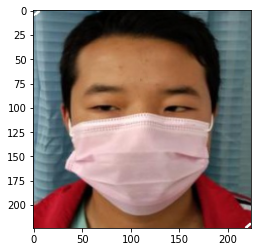

pred: 3 label: 0


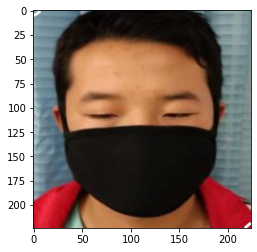

pred: 3 label: 0


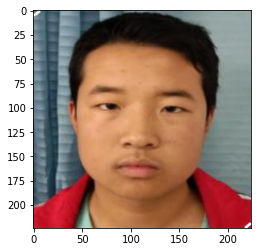

pred: 3 label: 0


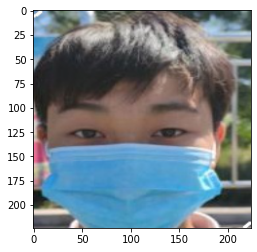

pred: 3 label: 0


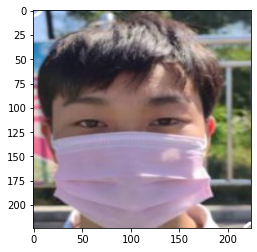

pred: 3 label: 0


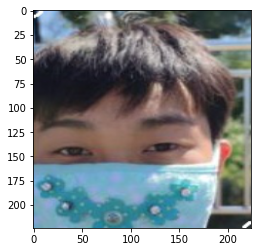

pred: 3 label: 0


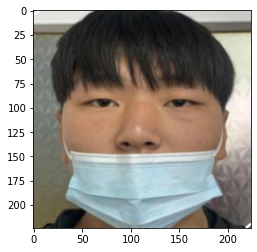

pred: 3 label: 0


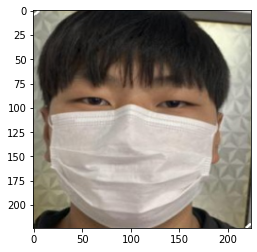

pred: 3 label: 0


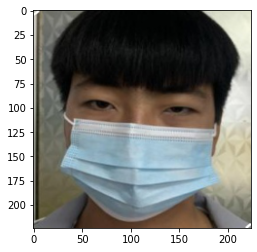

pred: 3 label: 0


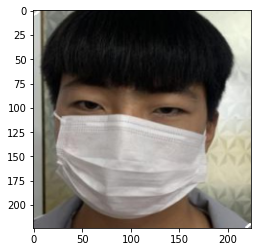

pred: 0 label: 3


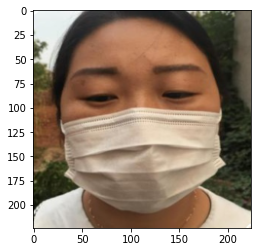

pred: 0 label: 3


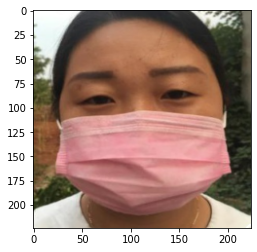

pred: 0 label: 3


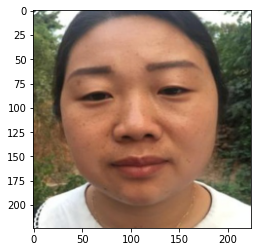

pred: 0 label: 3


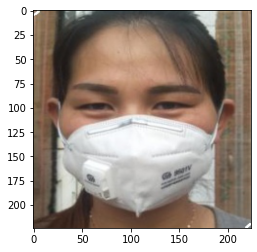

pred: 0 label: 3


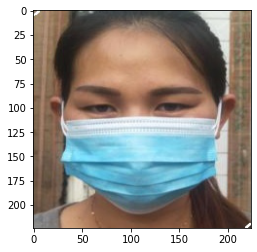

pred: 0 label: 3


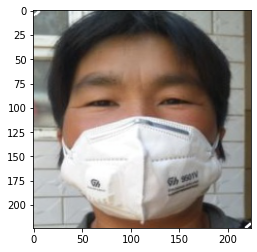

pred: 0 label: 3


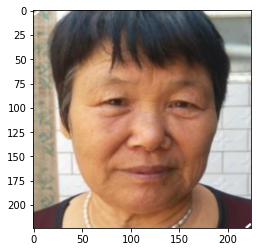

pred: 0 label: 3


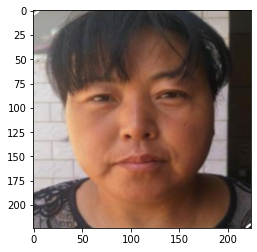

pred: 0 label: 3


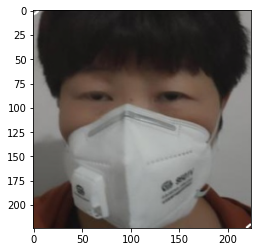

pred: 0 label: 3


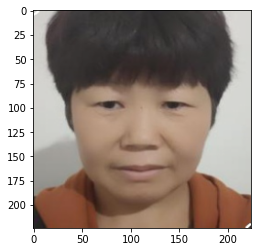

pred: 0 label: 3


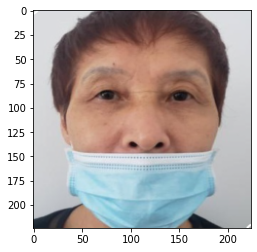

pred: 0 label: 3


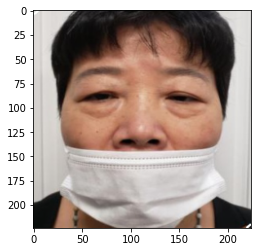

pred: 0 label: 3


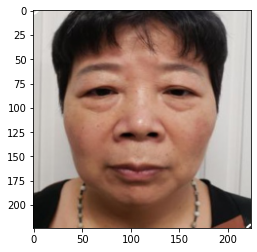

pred: 0 label: 3


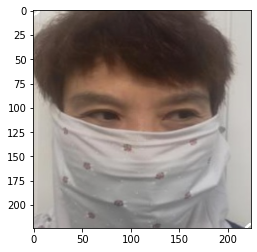

pred: 0 label: 3


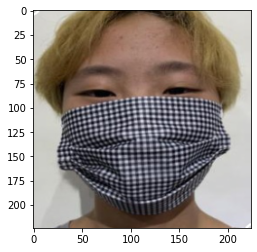

pred: 0 label: 3


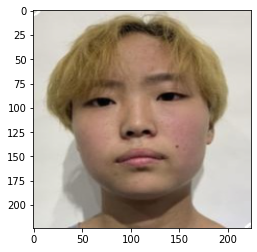

pred: 0 label: 3


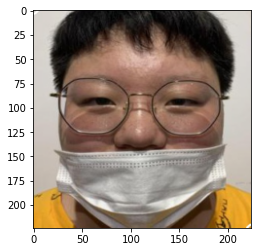

pred: 0 label: 3


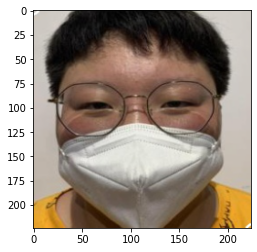

pred: 0 label: 3


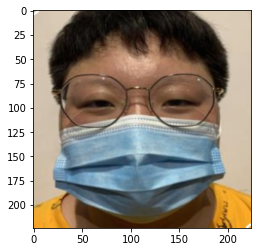

pred: 0 label: 3


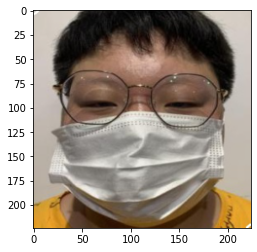

pred: 0 label: 3


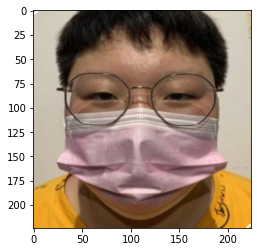

pred: 0 label: 3


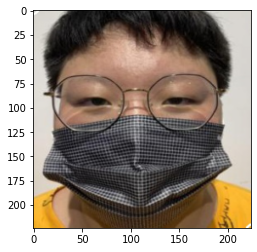

pred: 0 label: 3


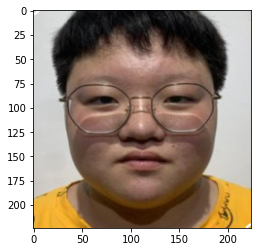

pred: 0 label: 3


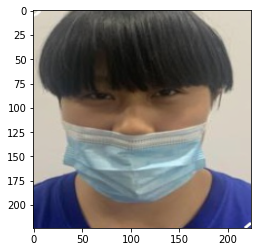

pred: 0 label: 3


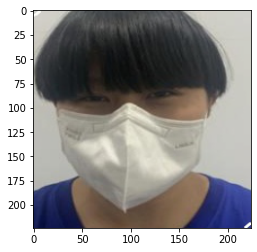

pred: 0 label: 3


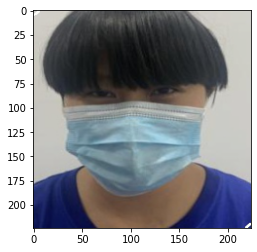

pred: 0 label: 3


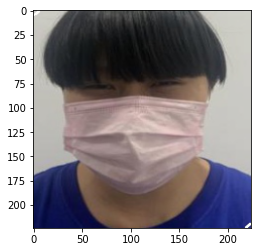

pred: 0 label: 3


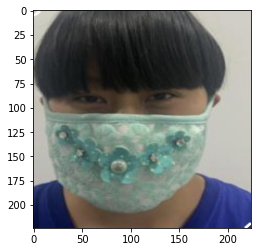

pred: 0 label: 3


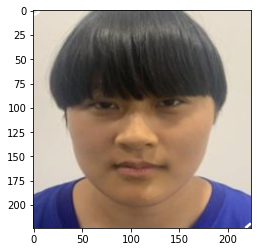

pred: 0 label: 3


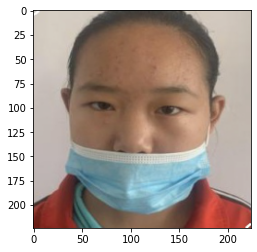

pred: 0 label: 3


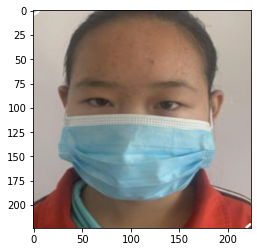

pred: 0 label: 3


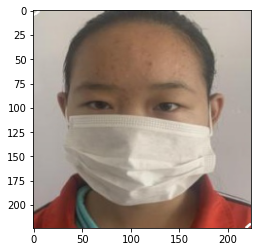

pred: 0 label: 3


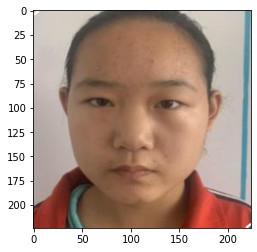

In [19]:
for p, l, im in zip(v_p_g, v_l_g, v_i_g):
    if p != l:
        pred = g_c[p]
        label = g_c[l]
        
        im = im.transpose((1, 2, 0))
        
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        im = std * im + mean
        im = np.clip(im, 0, 1)
        
        print(f'pred: {pred} label: {label}')
        plt.imshow(im)
        plt.show()

In [13]:
submission, v_p_a, v_l_a, v_i_a, a_c = model_run('age', submission.copy(), test_dir)

*****age*****
Dataset ImageFolder
    Number of datapoints: 15119
    Root location: /opt/ml/input/cropped_v2.1/train/train_age/
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=PIL.Image.BILINEAR)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

['0', '1', '2']



  0%|          | 0/119 [00:00<?, ?it/s]

****start epoch****


  0%|          | 0/119 [00:00<?, ?it/s]

#0 Loss: 0.3611 Acc: 85.9713 F1 Score: 0.6673 % Time: 33.1777s
Valid Loss: 0.4087 Valid Acc: 84.8717 F1 Score: 0.6580


  0%|          | 0/119 [00:00<?, ?it/s]

#1 Loss: 0.1862 Acc: 92.5921 F1 Score: 0.8399 % Time: 66.1715s
Valid Loss: 0.3479 Valid Acc: 86.5380 F1 Score: 0.7467


  0%|          | 0/119 [00:00<?, ?it/s]

#2 Loss: 0.1288 Acc: 95.1187 F1 Score: 0.9028 % Time: 99.0808s
Valid Loss: 0.5396 Valid Acc: 83.4964 F1 Score: 0.7112


  0%|          | 0/119 [00:00<?, ?it/s]

#3 Loss: 0.0546 Acc: 98.0224 F1 Score: 0.9599 % Time: 132.0005s
Valid Loss: 0.9562 Valid Acc: 74.9537 F1 Score: 0.6632


  0%|          | 0/119 [00:00<?, ?it/s]

#4 Loss: 0.0427 Acc: 98.5383 F1 Score: 0.9680 % Time: 164.9676s
Valid Loss: 0.7817 Valid Acc: 84.6337 F1 Score: 0.7430


  0%|          | 0/119 [00:00<?, ?it/s]

#5 Loss: 0.0192 Acc: 99.3783 F1 Score: 0.9867 % Time: 198.0125s
Valid Loss: 0.8107 Valid Acc: 85.2684 F1 Score: 0.7161


  0%|          | 0/119 [00:00<?, ?it/s]

#6 Loss: 0.0257 Acc: 99.1468 F1 Score: 0.9846 % Time: 230.9379s
Valid Loss: 1.5217 Valid Acc: 74.9008 F1 Score: 0.6538


  0%|          | 0/119 [00:00<?, ?it/s]

#7 Loss: 0.0050 Acc: 99.9008 F1 Score: 0.9993 % Time: 264.0713s
Valid Loss: 0.8854 Valid Acc: 85.4271 F1 Score: 0.7455


  0%|          | 0/119 [00:00<?, ?it/s]

#8 Loss: 0.0018 Acc: 99.9603 F1 Score: 0.9997 % Time: 296.9821s
Valid Loss: 1.1587 Valid Acc: 83.1526 F1 Score: 0.7229


  0%|          | 0/99 [00:00<?, ?it/s]

#9 Loss: 0.0004 Acc: 100.0000 F1 Score: 1.0000 % Time: 329.8576s
Valid Loss: 1.1604 Valid Acc: 83.9989 F1 Score: 0.7261


100%|██████████| 99/99 [00:09<00:00, 10.36it/s]


In [22]:
for p, l, im in zip(v_p_a, v_l_a, v_i_a):
    if p != l:
        pred = a_c[p]
        label = a_c[l]
        
        im = im.transpose((1, 2, 0))
        
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        im = std * im + mean
        im = np.clip(im, 0, 1)
        
        #print(f'pred: {pred} label: {label}')
        #plt.imshow(im)
        #plt.show()

In [23]:
wrong_age_idx = []

for i, p in enumerate(zip(v_p_a, v_l_a)):
    if p[0] != p[1]:
        wrong_age_idx.append(i)

w1 = 0
w2 = 0
w3 = 0
w4 = 0
w5 = 0
w6 = 0

for i in wrong_age_idx:
    if v_l_a[i] == 0:
        if v_p_a[i] ==1:
            w1 += 1
        elif v_p_a[i] ==2:
            w2 += 1
    elif v_l_a[i] == 1:
        if v_p_a[i] ==0:
            w3 += 1
        elif v_p_a[i] ==2:
            w4 += 1
    elif v_l_a[i] == 2:
        if v_p_a[i] ==0:
            w5 += 1
        elif v_p_a[i] ==1:
            w6 += 1

print(f'pred: 1 label: 0 count: {w1}')
print(f'pred: 2 label: 0 count: {w2}')
print(f'pred: 0 label: 1 count: {w3}')
print(f'pred: 2 label: 1 count: {w4}')
print(f'pred: 0 label: 2 count: {w5}')
print(f'pred: 1 label: 2 count: {w6}')           

pred: 1 label: 0 count: 14
pred: 2 label: 0 count: 0
pred: 0 label: 1 count: 323
pred: 2 label: 1 count: 111
pred: 0 label: 2 count: 7
pred: 1 label: 2 count: 150


In [15]:
submission = submission.astype({'age':'int','gender':'int','mask':'int'})

In [16]:
try : submission['ans'] = submission['mask'] + submission['gender'] + submission['age'] ; submission2 = submission.drop(['mask','gender','age'],axis=1)
except : pass
submission2

,ImageID,ans
0,cbc5c6e168e63498590db46022617123f1fe1268.jpg,13
1,0e72482bf56b3581c081f7da2a6180b8792c7089.jpg,2
2,b549040c49190cedc41327748aeb197c1670f14d.jpg,13
3,4f9cb2a045c6d5b9e50ad3459ea7b791eb6e18bc.jpg,13
4,248428d9a4a5b6229a7081c32851b90cb8d38d0c.jpg,12
...,...,...
12595,d71d4570505d6af8f777690e63edfa8d85ea4476.jpg,1
12596,6cf1300e8e218716728d5820c0bab553306c2cfd.jpg,4
12597,8140edbba31c3a824e817e6d5fb95343199e2387.jpg,9
12598,030d439efe6fb5a7bafda45a393fc19f2bf57f54.jpg,1


In [17]:
submission2.to_csv(os.path.join(test_dir, 'submission.csv'), index=False)